# Using ```modelflow``` with World Bank models

The ```Modelflow``` python package has been developed to solve a wide range of models, see the modelflow [github](gibhub.com) web site for working examples of the Solow Model, the FR/USB model and others.

The package has been substantially expanded to include special features that enable it to work with World Bank models originally developed in EViews and designed to use EViews Model Object for simuation.

This chapter illustrates how to access these models, how to load them into a ```modelflow``` anaconda environment on your computer and how to perform a variety of simulations 

## Accessing a world bank model

At this time several World bank macrostructural models are available to download and use with ```modelflow```.  These include a macrostructural model for:

* Indonesia
* Nepal
* Croatia
* Iraq
* Kenya
* Bolivia

Each of these models has been developed as part of the outreach work of the World Bank.  The basic modelling framework of each of these models is outlined in {cite:t}`burns_world_2019` with specific extensions reflecting features of the individual country modelled.

This book uses as an example a climate aware model for Pakistan developed in 2020 and described in {cite:t}`burns_climate_2021` .

The World Bank models are distributed in the `pcim` file format of the `modelflow` and can be downloaded by right clicking on the links above.  The Pakistan model can be downloaded [here](../models/pak.pcim) by right clicking on the above link and selecting Save Link as and placing the file on a directory accessible by your `modelflow` installation.

<span style="color:blue"> 
    Ib can't we have a package WorldBankMFModModels that one could import?  I seem to see this for other packages that have geographic data on countries or their population.   
   I imagining something like: </span>
    
```from worldbankMFModModels import pak```

 



## Preparing your python environment

As always, the ```modelflow``` and other python packages that will be used need to be imported into your python session.  The examples here and this book were written and solved in a *Jupyter Notebook*. There are some Jupyter specific commands included in these examples and these are annotated. However, the bulk of the content of the programs can be run in other environments, including Interactive Development Environments (IDE) like ```Spyder```or ```MS Visual Code```.  All the programs have been tested under ```spyder``` as well as Jupyter Notebook.

It is assumed that:
1. you have already installed ```modelflow``` and its various support packages following the instructions in Chapter xx
2. you are using Anaconda, and that
3. you have activated your ```modelflow``` environment by executing the following command from your python command line:

```
conda activate modelflow
```

where ```modelflow``` is the name you have given to the ```conda``` environment into which you installed ```modelflow```.


In [2]:
# import the model class from modelflow package
from modelclass import model 
import modelmf       # Add useful features to pandas dataframes 
                     # using utlities initially developed for modelflow
import pickle        # Used to store and retrieve model information
   

model.widescreen()   # These modelflow commands ensure that outputs from modelflow play well with Jupyter Notebook
model.scroll_off()

%load_ext autoreload   
%autoreload 2

## Working with PakMod under modelflow


The basic method for working with any model is the same. Indeed the initial steps followed here are the same as were followed during the simple model discussion.

Process:
1. Prepare the workspace
1. Load the model Modelflow
2. Design some scenarios  
3. Simulate the model
4. Visualize the results 



### Load a pre-existing model, data and descriptions 

To load a model use the ```model.modelload()``` method of ```modelflow```.

The command below

```
mpak,bline = model.modelload('C:\mflow\modelflow-manual\papers\mfbook\content\models\pak.pcim', alfa=0.7,run=1,keep= 'Baseline')
```
 
instantiates (creates an instance of) a `modelflow model` object and assigns it to the variable name mpak.  The ```run=1``` option executes the model and assigns the result of the model execution to the dataframe ```bline```.  The model is solved with the parameter alfa set to 0.7.  The $alfa \in (0,1)$ parameter determines the step size of the solution engine. The larger alfa the larger the step size. Larger step sizes solve faster, but may have trouble finding a unique solution.  Smaller step sizes take longer to solve but are more likely to find a unique solution.  Values of alfa=.7 work well for World Bank models.

The ```keep``` option instructs ```modelflow``` to maintain in the model object (```mpak```) the results of the intitial scenario, assigning it the text name ```Baseline```.


In [3]:

#Replace the path below with the location of the pak.pcim file on your computer
mpak,bline = model.modelload('C:\mflow\modelflow-manual\papers\mfbook\content\models\pak.pcim', \
                                alfa=0.7,run=1,keep= 'Baseline')



file read:  C:\mflow\modelflow-manual\papers\mfbook\content\models\pak.pcim




:::{note}
the variable ```bline``` contains the dataframe with the results of the simulation.  This is distinct from the data that is stored by the ```kept=``` command. That said, the data associated with each, while stored separately, have the same numerical values. The `keep` option is described in more detail toward the end of this section.
:::


:::{Admonition} Box [^BoxWBMnemonics]: World Bank Mnemonics

A typical World Bank model will have in excess of 300 variables.  Each has a mnemonic that is structured in a specific way, The root for almost all are 14 characters long (some special variables have additional characters appended to this root) (see discussion in section).


$$\texttt{12345678901234}$$
$$\color{ForestGreen}{\texttt{CCC}}\color{red}{\texttt{AA}}\color{SpringGreen}{\texttt{MMM}}\color{blue}{\texttt{NNNN}}\color{Magenta}{\texttt{U}}\color{black}{\texttt{C}}$$


where:

| Letters| Meaning |
|:---:|:---|
| $\color{ForestGreen}{\texttt{CCC}}$ | The three-leter ISO code for a country -- i.e. IDN for Indonesia, RUS for Russia | 
| $\color{red}{\texttt{AA}}$ | The two-letter major accounting system to which the variable attaches, | 
| $\color{LimeGreen}{\texttt{MMM}}$ |The three-letter major sub-category of the data -  i.e. GDP, EXP - expenditure | 
|$\color{blue}{\texttt{NNNN}}$ | The four-letter minor sub-category  MKTP for market prices |
| $\color{Magenta}{\texttt{U}}$ | The measure  (K: real variable;C: Current Values; X: Prices)|
|$\color{black}{\texttt{C}}$ | denotes the Currency (N: National currency; D: USD; P: PPP)|


Common major accounting systems mnemonics: the, $\color{red}{\texttt{AA}}$s from above:

| Code | Meaning |
|:--:|:--|
| NY | National income |
| NE | National expenditure Accounts|
| NV | Value added accounts |
| GG | General Government Accounts|
| BX | Balance of Payments: Exports |
| BM | Balance of Payments: Imports |
| BN | Balance of Payments: Net |
| BF | Balance of Payments: Financial Account |


Thus

| Mnemonic | Meaning |
|:--:|:---|
|IDNNYGDPMKTPKN| Indonesia GDP at market prices, real in Indonesian Rupiah|
|KENNECPNPRVTXN| Kenya Private (household) consumption expenditure schillings deflator |
|BOLGGEXPGNFSCN| Bolivia Government Expenditure on Goods and services (GNFS) in current Bolivars|
|HRVGGREVDCITCN| Croatia Government Revenues Direct Corporate Income Taxes in current Euros|
|NPLBXGSRNFSVCD| Nepal BOP Exports of non-factor services from the  goods and services accounts in current USD|
:::

### Extracting information about the model

The newly loaded python object  `mpak` is an instance of the model class and as such inherits the `methods` (functions) and `properties` (data) of that class. To learn about the model there are a variety of information methods that can be used to extract information about the model and its data.


**Information about a specific**

|Method | Example|Information returned |
|:--|:--|:--|
|`.des`|`modelname\['PAKNECONPRVTXN'\].des` | Dictionary of mnemonics and their variable descriptions |
|`.desc`|`modelname\['PAKNECONPRVTXN'\].desc` | List of variable description alone |


:::{note}
**Wildcards**
The ```*``` character in the command ```mpak['PAKNECON*XN'].names``` is a ```wildcard``` character and the extopression will return all variables that begin PAKNECON and end XN.  the ```?``` is another wildcard expression. It will match only single characters.  Thus ```mpak['PAKNECONPRVT?N'].names```  would return three variables: ```PAKNECONPRVTKN```, ```PAKNECONPRVTXN```, and ```PAKNECONPRVTXN```.  The real, current value, and deflators for household consumption expenditure.


:::


**Information about anumber of variables that meet certain search criteria**

The above functions can be used in conjunction with a wildcard specification to extract the same information about a number of variables that meet the criteria. To extract a list of all variables matching a pattern, we can use same methods.  

**Wildcards**

The **\*** operator matches multiple characters, the **?** operator matches just one character  

|Method | Example|Information returned |
|:--|:--|:--|
|`.des`  |`modelname.\['\*partialname\*'\].des` | Returns Dictionary of all mnemonic and variable descriptions whose mnemonic matches |
|`.desc` |`modelname.\['\*partialname'\].desc` | Returns list of variable descriptions whose mnemonic matches|
|`.names`|`modelname.\['\*partialname'\].names` | Returns list of variable mnemonics that match |


**The ! operator**
If a wildcard is preceded by an exclamation mark **!** the search will be done over the description of variables instead of the mnemonic

|Method | Example|Information returned |
|:--|:--|:--|
|`.des`  |`modelname.\['!\*GDP\*'\].des` | Returns Dictionary of all mnemonic and variable descriptions whose description contains the string GDP |
|`.desc` |`modelname.\['!\*Consumption\*'\].desc` | Returns list of variable descriptions whose description contains the string Consumption|
|`.names`|`modelname.\['!\*Agriculture\*'\].names` | Returns list of variable mnemonics whose description contains the string Agriculture|


**#Operator**
The *#* operator passes a predefined list to the search function and returns variable info about the variables in the  list

|Method | Example|Information returned |
|:--|:--|:--|
|`.des`  |`modelname.\['#MyList'\].des` | Returns Dictionary of all mnemonic and variable descriptions of the variables contained in the list MyList |
|`.desc`  |`modelname.\['#MyList'\].desc` | Returns list of variable descriptions whose description of the variables contained in the list MyList |
|`.names`  |`modelname.\['#MyList'\].names` | Returns list of variable mnemonics whose description of the variables contained in the list MyList|


#### Some examples

Return all variables that begin `PAKNECON` and end `KN`.

In [4]:
mpak['PAKNECON*XN'].names

['PAKNECONENGYXN', 'PAKNECONGOVTXN', 'PAKNECONOTHRXN', 'PAKNECONPRVTXN']

In [5]:
import fnmatch

def match_desc(model,s2Match):
    reverse_des  = {v:k for k,v in model.var_description.items()}
    list_des = fnmatch.filter(reverse_des.keys(),s2Match)
    list_var = [reverse_des[v] for v in list_des]
    Results = {}
    for key, val in zip(list_var,list_des):
        Results.setdefault(key,val)
    return Results

def match_mnem(model,s2Match):
    model.var_description.items()
    list_des = fnmatch.filter(model.var_description.keys(),s2Match)
    list_var = [model.var_description[v] for v in list_des]
    Results = {}
    for key, val in zip(list_var,list_des):
        Results.setdefault(key,val)
    return Results

desc=match_desc(mpak,"*GDP*")
mnems=match_mnem(mpak,"PAKNYGDPMKTP*N")

#mpak['!*GDP*'].des #returns the des of vars whose description match the string
#mpak['#listname'].des#the descriptions of teh variables in th list
#mpak['PAKNYGDPMKTP*N'].des  #the descriptions of the mnemonics that matchg

#mpak['!*GDP*'].desc#returns the des of vars whose description match the string

Return a dictionary comprised of the mnemonics and the descriptions of all the variables that begin `PAKNECONPRVT` and end `N`, but have one character between the T and the N.

In [6]:
mpak['PAKNECONPRVT?N'].des

PAKNECONPRVTCN : Pvt. Cons., LCU mn
PAKNECONPRVTKN : HH. Cons Real
PAKNECONPRVTXN : PAKNECONPRVTXN


Return a list of the full description  all the variables that have the word GDP in their description.

In [9]:
# Not yet released
#mpak['!*GDP*'].des

ValueError: max() arg is an empty sequence

Return a dictionary comprised of the variable name and description if all variables in a list.

In [14]:
#Functionality not yet activated.
#mylist=['PAKNECONPRVTKN','PAKNECONGOVTKN','PAKNEGDIFTOTKN','PAKNEEXPGNGSKN','PAKNEIMPGNFSKN']
#mpak['#mylist'].des

ValueError: max() arg is an empty sequence

## Behavioural equations in the MFMod framework

Recall a behavioural equation determines the value of an endogenous variable. For many of the variables in Wold Bank models, behavioural functions are estimated using an Error Correction Framework that splits the equation into a theoretically determined long run component and a more idiosyncratic short-run component. 



### The ECM specification

The ECM approach addresses the above challenge by modelling both the long run relationship and the short run short run behaviour and bringing them together into one equation.

The ECM specification is therefore a single equation comprised of two parts (the long run relationship, and the short-run relationship).

Consider as an example two variables say consumption and disposable income.  Both have an underlying trend or in the parlance are co-integrated to degree 1.  For simplicity we call them y an x.

#### The short run relationship

In its simplest form we might have a short run relationship between the growth rates of our two variables such that:

$$ \Delta log(Y_t) = \alpha + \beta \Delta log(X_t) +\epsilon_t $$

or substituting lower case letters for the logged values.

$$ \Delta y_t = \alpha + \beta \Delta x_t +\epsilon_t $$



#### The long run equation


The long run relates the level of the two (or more) variables.  We can write a simple version of that equation as:

$$ Y_t=αX_t^β+ \eta_t $$


Rewriting this (in logarithms) it can be expressed as:

$$ y_t = ln⁡(α) + βy_t + \eta_t	$$


### The long run equation in the steady state

First we note that in the steady state the expected value of the error term in the long run equation is zero ($\eta_t=0 $) so in those conditions we can simplify the long run relationship to:

$$y_t=ln⁡(α)+\beta x_t$$

or equivalently (substituting A for the log of $\alpha$).

$$y_t-A-βx_t=0$$

Moreover if we multiplied this by some arbitrary constant say $-\lambda$ it would still equal zero.

$$-\lambda(y_t -A-βx_t)$$ 

and in the steady state this will also be true for the lagged variables 

$$-\lambda(y_{t-1-} A - βx_{t-1})$$ 



## Putting it together

From before we have the short run equation:

$$ \Delta y_t = \alpha + \beta \Delta x_t +\epsilon_t $$

Inserting our steady state expression into the short run equation makes no difference (in the long run) because in the long run it is equal to zero.

$$ \Delta y_t = -\lambda(y_{t-1-}A-βx_{t-1})  + \alpha + \beta \Delta x_t +\epsilon_t $$

When we are not in the steady state the expression $ y_{t-1}-A-βx_{t-1} $ is of course the error term from the long run equation (a measure of how far we are away from equilibrium).  

### Lamda, the speed of adjustment
We can then interpret the parameter $$ \lambda $$ as the  speed of adjustment.  As long as $\lambda$ is greater than zero and less or equal to one if there are no further disturbances ( $\epsilon_t=0$) the expression multiplied by lambda will slowly decline toward zero. How fast depends on how large or small is $$\lambda$$.   

To be convergent $\lambda$ must be between 0 and 1, if its is negative or greater than one, then the long run portion of the equation will cause the disequilibrium to grow each period ($\lambda >1) not diminish or oscillate from positive to negative ($\lambda <0$).

<mark>Intuitively, the long run error term measures how far we are from equilibrium one period earlier (at t-1). The ECM term ensures that we will slowly converge to equilibrium -- the point at which the long run equation holds exactly. If $$\lambda$$ is greater than zero but less than one (or equal to one) some portion of the previous period year's disequilibrium will be absorbed each year. How much is absorbed depends on the size of estimated speed of the adjustment coefficient $\lambda$. </mark>

Looking at an ECM equation we can then break it up into its component parts.  For the consumption function it will look something like this:

$$ \Delta c_t = -\lambda (\underbrace{
        log(C_{t-1})-log(Wages_{t-1}-Taxes_{t-1}+Transfers_{t-1} + \alpha)}   _\text{Long run}
+\beta \underbrace{\Delta y_t}_\text{short run}$$


#### Equation information methods

There are several functions to extract the equations from a model.  The two most interesting are:

|Command|Effect|
|:--|:--|
|```mpak['PAKNECONPRVTKN'].frml```|Returns the **normalized** version of the equation (the one actually used in modelflow)|
|```mpak['PAKNECONPRVTKN'].eviews```|In World Bank models imported from Eviews, reports the original eviews specification|
|```mpak['PAKNECONPRVTKN'].original```|Returns an intermediate version of the unnormalized equation, that replaces EViews syntax with Business Logic syntax|


If we look at the equation for consumption in ```mpak``` we see that it follows something very close to this formulation. 





In [123]:
mpak.PAKNECONPRVTKN.frml
mpak.var_description['PAKNYGDPMKTPKN']

Endogeneous: PAKNECONPRVTKN: HH. Cons Real
Formular: FRML <Z,EXO> PAKNECONPRVTKN = (PAKNECONPRVTKN(-1)*EXP(PAKNECONPRVTKN_A+ (-0.2*(LOG(PAKNECONPRVTKN(-1))-LOG(1.21203101101442)-LOG((((PAKBXFSTREMTCD(-1)-PAKBMFSTREMTCD(-1))*PAKPANUSATLS(-1))+PAKGGEXPTRNSCN(-1)+PAKNYYWBTOTLCN(-1)*(1-PAKGGREVDRCTXN(-1)/100))/PAKNECONPRVTXN(-1)))+0.763938860758873*((LOG((((PAKBXFSTREMTCD-PAKBMFSTREMTCD)*PAKPANUSATLS)+PAKGGEXPTRNSCN+PAKNYYWBTOTLCN*(1-PAKGGREVDRCTXN/100))/PAKNECONPRVTXN))-(LOG((((PAKBXFSTREMTCD(-1)-PAKBMFSTREMTCD(-1))*PAKPANUSATLS(-1))+PAKGGEXPTRNSCN(-1)+PAKNYYWBTOTLCN(-1)*(1-PAKGGREVDRCTXN(-1)/100))/PAKNECONPRVTXN(-1))))-0.0634474791568939*DURING_2009-0.3*(PAKFMLBLPOLYXN/100-((LOG(PAKNECONPRVTXN))-(LOG(PAKNECONPRVTXN(-1)))))) )) * (1-PAKNECONPRVTKN_D)+ PAKNECONPRVTKN_X*PAKNECONPRVTKN_D  $

PAKNECONPRVTKN  : HH. Cons Real
DURING_2009     : 
PAKBMFSTREMTCD  : Imp., Remittances (BOP), US$ mn
PAKBXFSTREMTCD  : Exp., Remittances (BOP), US$ mn
PAKFMLBLPOLYXN  : Key Policy Interest Rate
PAKGGEXPT

'Real GDP'

Remember the ```.frml``` method presents the economic equation in a normalized form.

(PAKNECONPRVTKN(-1)*EXP(-PAKNECONPRVTKN_A+ (-0.2*(LOG(PAKNECONPRVTKN(-1))-LOG((PAKNYYWBTOTLCN(-1)*(1-PAKGGREVDRCTXN(-1)/100))/PAKNECONPRVTXN(-1)))+1*((LOG((PAKNYYWBTOTLCN*(1-PAKGGREVDRCTXN/100))/PAKNECONPRVTXN))-(LOG((PAKNYYWBTOTLCN(-1)*(1-PAKGGREVDRCTXN(-1)/100))/PAKNECONPRVTXN(-1))))+0.0303228629698929+0.0163839011059956*DURING_2010-0.3*(PAKFMLBLPOLYXN/100-((LOG(PAKNECONPRVTXN))-(LOG(PAKNECONPRVTXN(-1)))))) )) * (1-PAKNECONPRVTKN_D)+ PAKNECONPRVTKN_X*PAKNECONPRVTKN_D  $

 Taking logarithms of both sides of the the first expression (excluding the \*(1-PAKNECONPRVTKN\_D) term) and collecting the PAKNECONPRVTKNs onm teh left-hand side , we can recover the originally estimated ECM expression, where we simplify the mnemonics to ease reading of the equation using:
 
 | Model Mnemonic | Simplified | Meaning |
 |:---|:---|:---|
 |PAKNECONPRVTKN| $CON^{KN}_t$  |Household Consumption|
 |DURING_2010    | $D^{2010}_t$ | A dummy |
| PAKFMLBLPOLYXN | $r^{policy}_t$|Policy Rate |
| PAKGGREVDRCTXN |  $DirectTxR_t$ | Direct Taxes: Effective rate|
| PAKNECONPRVTKN_A| $CON^{KN_AF}_t$| Add factor:Household Consumption|
|PAKNECONPRVTXN  |  $CON^{XN}_t$ | Household Consumption deflator |
|PAKNYYWBTOTLCN  | $WAGEBILL^{CN}_t$ | Economy-wide wage bill|
 
 
$$\Delta log(CON^{KN}_t) = -0.2*\bigg[LOG(CON^{KN}_{t-1})-LOG\bigg({{WAGEBILL^{CN}_{t-1}*(1-DirectTxR_{t-1}/100)} \over {CON^{XN}_{t-1}}}\bigg)\bigg] + 1.0*\Delta log \bigg( {{WAGEBILL^{CN}_{t}*(1-DirectTxR_{t}/100)} \over {CON^{XN}_{t}}}\bigg)$$

$$+0.030 + 0.016*D^{2010}_t-0.3*\bigg(r^{policy}_t/100-\Delta log(CON^{XN}_{t})\bigg) -CON^{KN_AF}_t $$

Where in this instance the short-run elasticity of consumption to disposable income has been constrained to 1, and teh short run elasticitya of consumption to the real interest rate is 0.3.




The ```mpak['PAKNECONPRVTKN'].eviews``` command returns the equations in a slightly more legible form, where the $\Delta ln()$ expressions are written using eviews syntax as dlog().


In [ ]:
## This command not yet released, un comment when available.
##mpak.PAKNECONPRVTKN.eviews

## Scenario analysis

An essential feature of a model is that when given a specific set of inputs (the exogenous variables to the model) it will always return the same results. As noted when, as was the case of the load, the model is solved without changing any inputs we would expect that the model will return exactly the same data as before.  To test this for ```mpak``` we can compare the results from the simulation using the ```basedf``` and ```lastdf``` dataframes.

:::{Recall}
The ```model``` object (```mpak``` in this instance) always contains two dataframes, the ```.basedf``` dataframe that contains the initial values for the variables of the model, and the ```.lastdf``` which contain the results of the most recently executed scenario.
:::

Below we are gratified to see that the percent difference between the variables in the two dataframes following a simulation where the inputs were not changes is zero.

In [6]:
# Need statement to change the default format
mpak.smpl(2020,2030)
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].difpctlevel.mul100.df



,PAKNYGDPMKTPKN,PAKNECONPRVTKN
2020,0.0,0.0
2021,0.0,0.0
2022,0.0,0.0
2023,0.0,0.0
2024,0.0,0.0
2025,0.0,0.0
2026,0.0,0.0
2027,0.0,0.0
2028,0.0,0.0
2029,0.0,0.0


### Different kinds of simulations

The ```modelflow``` package allows us to do 4 different kinds of simulations:

1. A shock to an exogenous variable in the model
2. An exogenous shock of a behavioural variable, executed by exogenizing the variable
3. An endogenous shock of a behavioural variable, executed by shocking the add factor of the variable.
4. A mixed shock of a behavioural variable, achieved by temporarily exogenixing the variable.

Although technically modelflow would allow us to shock identities, that would violate their nature as accounting rules so we exclude this possibility. 


#### A shock to an exogenous variable

A World Bank model will reproduce the same values if inputs (exogenous variables) are not changed.  In the simulation below we change the oil price increasing it by $25 for the three years between 2025 and 2027 inclusive.

To do this we first create a new input dataframe with the revised data.

Then we use the ```mfcalc``` method to change the value for the three years in question.

Finally we do a but of pandas math to display the initial value, the changed value and the difference between the two, confirming that the mfcalc statement did what we hoped.

In [7]:
#Make a copy of the baseline dataframe
oilshockdf=mpak.basedf
oilshockdf=oilshockdf.mfcalc("<2025 2027> WLDFCRUDE_PETRO = WLDFCRUDE_PETRO +25")

compdf=mpak.basedf.loc[2000:2030,['WLDFCRUDE_PETRO']]
compdf['LASTDF']=oilshockdf.loc[2000:2030,['WLDFCRUDE_PETRO']]
compdf['Dif']=compdf['LASTDF']-compdf['WLDFCRUDE_PETRO']
compdf


,WLDFCRUDE_PETRO,LASTDF,Dif
2000,28.229719,28.229719,0.0
2001,24.351825,24.351825,0.0
2002,24.927748,24.927748,0.0
2003,28.898903,28.898903,0.0
2004,37.733388,37.733388,0.0
2005,53.391025,53.391025,0.0
2006,64.288259,64.288259,0.0
2007,71.116559,71.116559,0.0
2008,96.990454,96.990454,0.0
2009,61.756922,61.756922,0.0


#### Running the simulation

Having created a new dataframe comprised of all the old data plus the changed data for the oil price we can execute the simulation.  In the command below, the simulation is run from 2020 to 2040, using the oilshockdf as the input dataframe.  The results of the simulation will be put into a new dataframe ```ExogOilSimul```.  The ```Keep``` command ensures that the mpak model object stores (keeps) a copy of the results identified by the text name *'$25 increase in oil prices 2025-27'*.

In [8]:

ExogOilSimul = mpak(oilshockdf,2020,2040,keep='$25 increase in oil prices 2025-27') # simulates the model 

Using the ```modelflow``` visualization tools we can see the impacts of the shock; as a print out; as charts and within Jupyter notebook as an interactive widget.

##### Results

Here we confirm that the shock we wanted to introduce was executed. The dif.df method returns the difference between the selected variable(s) as a dataframe, the ```smpl method``` restructs the time period of over which subsequent commands are effectuated.


In [9]:
mpak.smpl(2020,2030)
mpak['WLDFCRUDE_PETRO'].dif.df

,WLDFCRUDE_PETRO
2020,0.0
2021,0.0
2022,0.0
2023,0.0
2024,0.0
2025,25.0
2026,25.0
2027,25.0
2028,0.0
2029,0.0


Below we look at the impact of this change on a few variables, expressed as a percent deviation of the variable from its pre-shock level.

The first variable ```PAKNYGDPMKTPKN``` is Pakistan's real GDP, the second ```PAKNECONPRVTKN``` is real consumption and the third is the Consumer price deflator ```PAKNECONPRVTXN```.



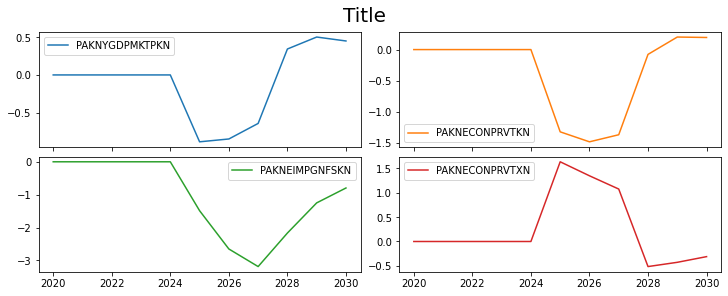

In [10]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(Title="Impact of temporary $25 hike in oil prices")


The graphs show the change in the level as a percent of the previous level. The graphs suggest that a temporary $25 oil price hike would reduce GDP in the first year by about 1.5 percent, that the impact would diminish in the second year to about -.25 percent and that the impact would turn positive in the fourth year when the price effect was eliminated.  
The negative impact would on household consumption would be stronger but follow a similar pattern.  The reason that the GDP impact is smaller, is partly because of the impact on imports which decline strongly.  Because imports enter into the GDP identity with a negative sign they reduce the overall impact on GDP.

Finally as could be expected prices rise sharply initially with higher oil prices, but as the slow down in growth is felt, inflationary pressures turn negative and the overall impact on the price level turns negative.  The graph above shows what is happening to the **price level**. To see the impact on inflation (the rate of growth of prices) we will have to do a separate graph using ```difpct.mul100```, which shows teh change in the rate of growth of variables where the growth rate is expressed as a per cent. 

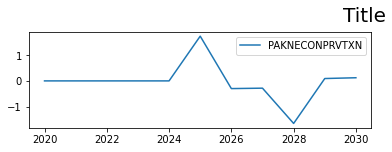

In [11]:
mpak['PAKNECONPRVTXN'].difpct.mul100.plot(Title="Change in inflation from a temporary $25 hike in oil prices")

This view, gives a more nuanced result.  Inflation spikes initially by about 1.2 percent, but falls below as the influence of the slowdown weighs on the lagged effect of higher oil prices. In 2028 when oil prices drop back to their previous level this adds to the dis-inflationary forces in the economy at first, but the boost to demand fro lower prices soon translates into an acceleration in growth and higher inflation.



### An exogenous shock to a Behavioural variable 

Behavioural equations can be de-activated by exogenizing them, either for the entire simulation period, or for a selected sub period.  In this example we exogenize consumption for the entire simulation period. 

To motivate the simulation we assume that a change in weather patterns has increased the number of sunny days by 10 percent which has increased households happiness and therefore causes them to permanently increase their spending by 2.5% beginning in 2025.

We can do so either by manually or use the method ```.fix()```. For simplicity we will use ```.fix()``` and we will explain the manual steps that ```.fix()``` does for us.

To exogenize ```PAKNECONPRVTKN``` for the entire simulation period we will first create a new dataframe as a slightly modified version of our basedf.

```Cfixed=mpak.fix(mpak.basedf,PAKNECONPRVTKN)```

This does two things, that we could have done manually.  First it sets the dummy variable ```PAKNECONPRVTKN_D=1``` for the entire simulation period -- effectively transforming the equation to ```PAKNECONPRVTKN=PAKNECONPRVTKN_X```.  Then it sets the variable ```PAKNECONPRVTKN_X``` in the ```Cfixed``` dataframe equal to the value of ```PAKNECONPRVTKN``` in the ```basedf``` dataframe. All the other variables are  just copies of their values in basedf.

With PAKNECONPRVTKN_D=1 throughout the normal behavioural equation is effctively de-activated or exogenized.



In [12]:
mpak.smpl() # reset the active sample period to the full model.
Cfixed=mpak.fix(baseline,'PAKNECONPRVTKN')

For the moment, the equation is exogenized but the values have been set to the same values as the ```.basedf``` dataframe, so solving the model will not change anything.

Our assumption was that Real consumption would be 2.5% stronger.

WE can change the value of PAKNECONPRVTYKN using the ```.upd``` method

In [13]:
Cfixed=Cfixed.upd("<2025 2040> PAKNECONPRVTKN_X  * 1.025")

Having made this change we can solve the model, by passing it the new CFixed dataframe.

```CFixedRes = mpak(Cfixed,2020,2040,keep='2.5% increase in C 2025-40') ```

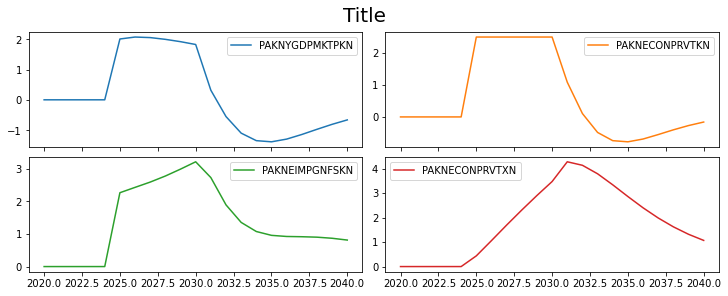

In [14]:
CFixedRes = mpak(Cfixed,2020,2040,keep='2.5% increase in C 2025-40') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(Title="Impact of temporary $25 hike in oil prices")


In [15]:
import pandas as pd
with pd.option_context('display.float_format', '{:,.2f}'.format):
    with mpak.set_smpl(2020,2040):
        print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.df)


      PAKNYGDPMKTPKN  PAKNECONPRVTKN  PAKNEIMPGNFSKN  PAKNECONPRVTXN
2020            0.00            0.00            0.00            0.00
2021            0.00            0.00            0.00            0.00
2022            0.00            0.00            0.00            0.00
2023            0.00            0.00            0.00            0.00
2024            0.00            0.00            0.00            0.00
2025            2.01            2.50            2.27            0.44
2026            2.07            2.50            2.43            1.06
2027            2.05            2.50            2.59            1.69
2028            1.99            2.50            2.78            2.31
2029            1.92            2.50            2.99            2.90
2030            1.83            2.50            3.22            3.47
2031            0.32            1.09            2.73            4.27
2032           -0.55            0.11            1.89            4.13
2033           -1.10           -0.

The permanent rise in consumption by 2.5 percent causes a temporary increase in GDP of close to 2% (1.86). Higher imports tend to diminish the effect on GDP, while over time higher prices due to the inflationary pressures caused by the additional demand cause the GDP impact to diminish to close to zero by th end of the sample period.

### Temporarily exogenize a behavioural variable

The third method of formulating a scenario involves temporarily exogenizing a variable.    The methodology is the same except the period for which the variable is exogenized is different. 

To fully explore the differences in the approaches, we will do three scenarios.  

1. We exogenize the variable for the whole period, but shock it for three years (2025-2027). 
1. We exogenize the variable for the whole period, but shock it for three years (2025-2027)-- but use the --kg option to keep the growth rates of the exogenized variable the same in the post-shock period.
1. We exogenize the variable only for the period during which we shock the dependent variable (2025-2027)

#### Temporary shock exogenized for the whole period

Here the set up is basically the same as before.

mpak.smpl() # reset the active sample period to the full model.
Cfixed=mpak.fix(baseline,'PAKNECONPRVTKN')


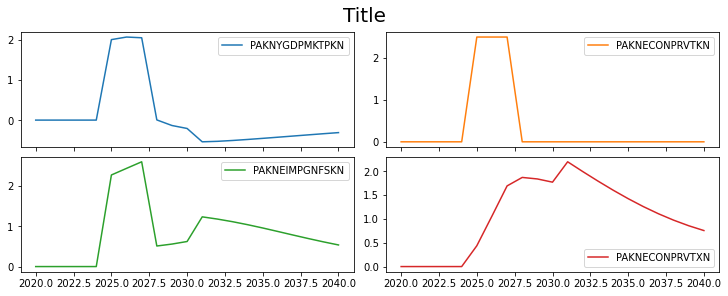

In [16]:
mpak.smpl() # reset the active sample period to the full model.
CTempExogAll=mpak.fix(baseline,'PAKNECONPRVTKN')
CTempExogAll=CTempExogAll.upd("<2025 2027> PAKNECONPRVTKN_X * 1.025")

#Now we solve the model
CTempXAllRes = mpak(CTempExogAll,2020,2040,keep='2.5% increase in C 2025-27 -- exog whiole period') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(Title="Impact of temporary $25 hike in oil prices")



Here the results are quite different.  GDP is boosted initially as before but when consumption drops back to its pre-shock level, GDP and imports decline sharply.

Prices (and inflation) are higher initially but when the economy starts to slow after 2025 prices start to fall (disinflation).



#### Temporary shock exogenized for the whole period

In this scenario we do exactly the same as in the previous but instead of mfcalc we use the upd command on the dataframe with the --KG (keep_growth) option to maintain the pre-shock growth rates of consumption in the post-shock period.

The set up is identical except replacing the mfcalc call with the upd call.

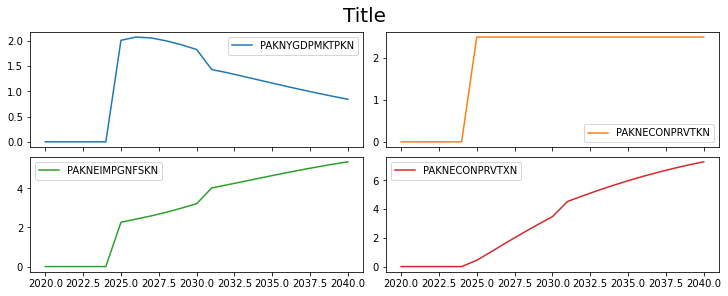

In [17]:
mpak.smpl() # reset the active sample period to the full model.
CTempExogAllKG=mpak.fix(baseline,'PAKNECONPRVTKN')
CTempExogAllKG = CTempExogAllKG.upd('''
<2025 2027> PAKNECONPRVTKN_X * 1.025 --kg
''',lprint=0)

#Now we solve the model
CTempXAllResKG = mpak(CTempExogAllKG,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --keep_growth=TRUE') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(Title="2.5% boost o cons 2025-27 --keep growth=true")




### Exogenize the variable only for the period during which it is shocked

This is version of our scenario introduces a subtle but import difference.  Here we will exogenize the variable, again using the fix syntax. But this time we will exogonize it only for the period where the variable is shocked.

What this means is that the consumption function will be de-actvated for only three years (instead of the whole period as in the previous examples).  As a result, the values consumption take in 2028, 2029, ... 2040 will depend on the model, not the level it was set to when exogenized (which was the case in the 3 previous versions).



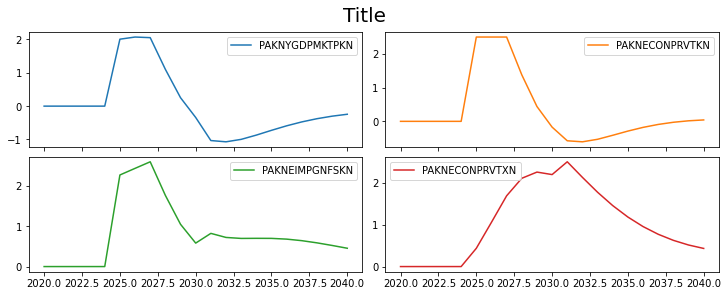

In [18]:
mpak.smpl() # reset the active sample period to the full model.
CExogTemp=mpak.fix(baseline,'PAKNECONPRVTKN',2025,2027)
CExogTemp = CExogTemp.upd('<2025 2027> PAKNECONPRVTKN_X * 1.025',lprint=0)

#Now we solve the model
CExogTempRes = mpak(CExogTemp,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --keep_growth=TRUE') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(Title="2.5% boost o cons 2025-27 --keep growth=true")



These results have subtle differences compared with the previous.  The most obvious is visible in looking at the graph for Consumption.  Rather than reverting immediately to its earlier pre-shock level, it falls more gradually and never falls all the way back to its pre-shock level.  That is because unlike in the previous shocks, its path is being determined endogenously and reacting to changes elsewhere in the model, notably changes to prices, wages and government spending.

In [19]:
print(f'Value of GDP in 2028: {baseline.loc[2028,"PAKNYGDPMKTPCN"]:,.0f}')
print(f'Base value in 2028: {baseline.loc[2028,"PAKNECONPRVTKN"]:,.0f}. Alternative value: {CExogTempRes.loc[2028,"PAKNECONPRVTKN"]:,.0f}.'
    f'Difference: {(CExogTempRes.loc[2028,"PAKNECONPRVTKN"]-baseline.loc[2028,"PAKNECONPRVTKN"]):,.0f}.')

Value of GDP in 2028: 96,077,331
Base value in 2028: 27,241,278. Alternative value: 27,616,949.Difference: 375,671.


### Access results 

With each simulation we have stored the results in a unique dataframe.  We can use our standard pandas routines and other python libraries like **Matplotlib** and **Plotly** to vusalize results.

Indeed in the preceiding apragraphs we have used these as well as some ```modeflow``` routines that extent the standard abilities of pandas.



### Simulation with Add factors

Add factors are a crucial element of the macromodels of the World Bank and serve multiple purposes.

In simulation, add-factors allow simulations to be conducted **without** de-activating behavioural equations.  As such, they are often referred to as **endogenous** shocks (versus an exogenous shock).

In some ways they are very similar to a temporary exogenous shock. Both ways of producing the shock allow the shocked variable to respond endogenously in the period after the shock.  The main difference between the two approaches is that:

 * **Endogenous** shocks (Add-Factor shocks) allow the shocked variable to respond to changed circumstances that occur during the period of the shock.
     * This approach makes most sense for "animal spirits", shocks where the underlying behaviour is expected to change.
     * Also makes sense when actions of one part of an aggregate is likely to impact behaviour of other sectors within an aggregate
     * increased investment by a particular sector would be an example here as the associated increase in activity is likely to increase investment incentives in other sectors, while increased demand for savings will increase interest rates and the cost of capital operating in the opposite direction.  
     * Sustained changes in behaviour, for example increased propensity to invest because of improved recognition 
     
 * **Exogenous** shocks to endogenous variables fix the level of the shocked variable during the shock period. 
     * Changes in government spending policy, something that is often largely an economically exogenous decision.
     
#### Simulating the impact of a planned investment

The below simulation uses the add-factor to simulate the impact of a 3 year investment  program of 1 percent of GDP per year, beginning in 2025, being financed through foreign direct investment.  The add-factor approach is chosen because the additional investment is likely to increase demand for the products of other firms and have important knock on effects for investment as well as other components of demand.

##### How to translate the economic shock into a model shock

Add-factors in the ```MFMod``` framework are applied to the intercept of an equation (not the level of the dependent variable).  This preserves the estimated elasticities of the equation, but makes introduction of an add-factor shock somewhat more complicated than the exogenous approach.  Below a step-by-step how-to guide:

1. Identify numerical size of the shock
2. Examine the functional form of the equation, to determine the nature of the add factor.  If the equation is expressed as a:
    * **growth rate** then the add-factor will be an addition or subtraction to the growth rate
    * **percent of GDP (or some other level)** then the add-factor will be an addition or subtraction to the share of growth.
    * **Level** then the add-factor will be a direct addition to the level of the dependent variable
3. Convert the economic shock into the units of the add-factor
4. Shock the add-factor by the above amount and run the model
    * Note the add-factor is an exogenous variable in the model, so shocking it follows the well established process for shocking an exogenous variable.


 

##### Determine the size of shock

Above we identified the shock as to be a 1 percent of GDP increase in FDI that flows directly into private-sector investment.  A first step would be to determine the variables that need to be shocked (FDI) and private investment. To do this we can query the variable dictionary.



##### Identify the functional form(s)



In [ ]:
mpakinfo.

##### Calculate the size of the required add factor shock




##### Run the shock

### Using kept results to visualize results 

With each of the simulations above we used the ```keep=``` option to store the results of the simulations within the model object. 

In addition to the ability to store results in this way, modelflow includes methods to retrieve, display and compare results that were kept.  This can be very useful when doing a number of similar simulations as was the case above.

For example the keep_plot routines will plot the value, growth rate or percent change in levels of different values across all of the kept solutions.


#### Differences of growth rates 

For example below we have graphs of the growth rates of GDP, Consumption and Imports from the four scenarios that we have run.

In [20]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', \
               diff=1,showtype='growth', \
               savefig='testgraph/tax_impact_growth_.svg',legend=0);


#### Differences in percent of baseline values

In this plot, the same results are presented, but as percent deviations from the baseline values of the displayed data.

In [21]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', \
               diffpct=1,showtype='level', \
               savefig='testgraph/tax_impact_pctdiflevel_.svg',legend=0);




### Some variations on keep_plot(

The **variables** we want to be displayed is listed as first argument. Variable names can include 
wildcards (using * for any string and ? for any character) 

**Transformation of data displayed:** 

| showtype= |Use this operator|
| :- | :---|
 'level' (default)|No transformation  
 'growth'| The growth rate  in percent 
 'change'| The yearly change ($\Delta$) 

**legend placement**

| legend= |Use this operator|
| :- | :---|
 False (default) |The legends will be placed at the end of the corresponding line
 True|The legends are places in a legend box


Often it is useful to compare the scenario results with the baseline result. This is done with the diff argument. 

| diff= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference to the first entry is shown.

It can also be useful to compare the scenario results with the baseline result **measured in percent**. This is done with the diffpct argument. 

| diffpct= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference in percent to the first entry is shown
 
 
 ```savefig='[path/]<prefix>.<extension>'```
 Will create a number of files with the charts.<br>
 The files will be saved location with name ```<path>/<prefix><variable name>.<extension>``` <br>The extension determines the 
 format of the saved file: ```pdf```, ```svg``` and ```png``` are the most common extensions. 

In [22]:
mpak.fix_dummy_fixed

['PAKNECONPRVTKN_D']

In [23]:
mpak['PAKNYGDPMKTPCN PAKNYGDPMKTPKN PAKGGEXPTOTLCN PAKGGREVTOTLCN PAKNECONGOVTKN']

In [24]:
mpak.keep_solutions.keys()

dict_keys(['Baseline', '$25 increase in oil prices 2025-27', '2.5% increase in C 2025-40', '2.5% increase in C 2025-27 -- exog whiole period', '2.5% increase in C 2025-27 -- exog whole period --keep_growth=TRUE'])

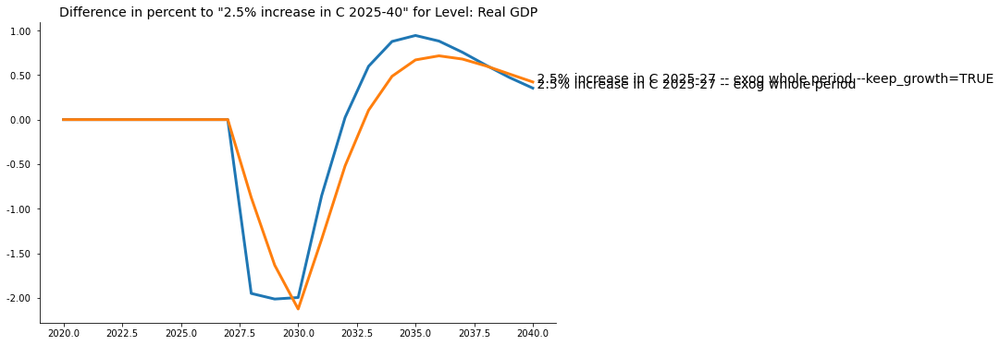

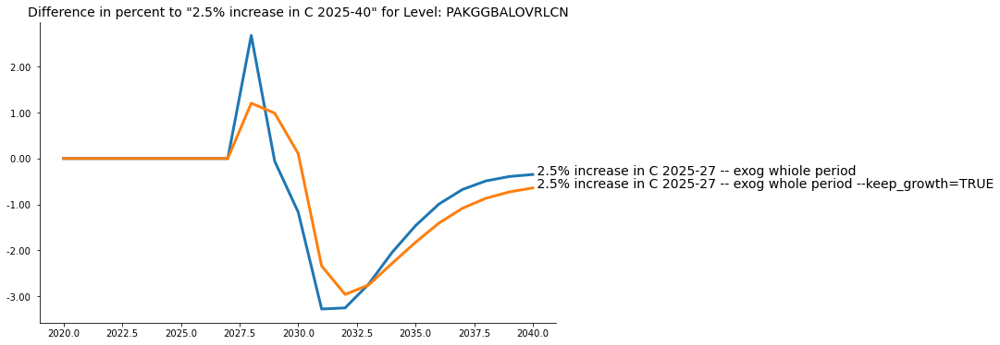

In [25]:
with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whiole period|2.5% increase in C 2025-27 -- exog whole period --keep_growth=TRUE'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',diffpct=1,showtype='level',legend=0);